<h1 align="center"> Results </h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from config import path

In [2]:
import logging
from logs import turning_logger

turning_logger.setLevel(logging.INFO)

In [3]:
SPORTS = ("basketball", "handball", "soccer", "volleyball")

path.PLOT_PATH.mkdir(parents=True, exist_ok=True)

<h2> Dataset </h2>

In [4]:
from data_analysis.read_datasets import read_as_dicts

In [5]:
KEYS_TO_READ = [
    "matches",
    "var_stats",
    "tp",
    "permuted_tp",
    "optimal_tp",
    "diff_points_tp",
]

key_to_sport_to_data = read_as_dicts(SPORTS, KEYS_TO_READ)
key_to_sport_to_data["tp/0.99"] = read_as_dicts(SPORTS, "tp", 0.99)["tp"]

In [6]:
from turning_point.match_coefficient import MatchTurningPoint

key_to_sport_to_data["mtp"] = {
    sport: MatchTurningPoint.from_matches_and_turning_point(
        key_to_sport_to_data["matches"][sport],
        key_to_sport_to_data["tp"][sport]
    )
    for sport in SPORTS
}

In [7]:
import warnings
from turning_point.permutation_coefficient import TurningPointComparison

PERCENTILES = [2.5, 25, 50, 75, 97.5]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")

    key_to_sport_to_data["comparison_tp"] = {
        sport: TurningPointComparison(
            key_to_sport_to_data["tp"][sport], 
            key_to_sport_to_data["permuted_tp"][sport],
            key_to_sport_to_data["optimal_tp"][sport],
        ).comparison(PERCENTILES)
        for sport in SPORTS
    }

<h2> Style </h2>

In [8]:
import data_analysis.plots.utils.customization
from data_analysis.plots.utils.plot_functions import flatten_axes

In [9]:
import data_analysis.plots.comparison_scatter as comp_scatter

from data_analysis.plots.variances_temporal_progression import plot_variances_temporal_progression
from data_analysis.plots.turning_point_boxplot import plot_boxplot_turning_points
from data_analysis.plots.comparison_boxplot import plot_comparison_boxplot
from data_analysis.plots.new_pontuation import plot_new_pontuation_system

<h2> Temporal Progression </h2>

In [10]:
TOURNEY_NAMES_AND_IDS = (
    ("NBA (Basketball: 2019/20)", "nba@/basketball/usa/nba-2019-2020/"),
    ("Superleague RU (Volleyball: 2019/20)", "superleague@/volleyball/russia/superleague-2019-2020/"),
    ("La Liga (Soccer: 2019/20)", "laliga@/soccer/spain/laliga-2019-2020/"),
    ("Bundesliga (Handball: 2019/20)", "bundesliga@/handball/germany/bundesliga-2019-2020/"),
)
LAST_DATE = 60

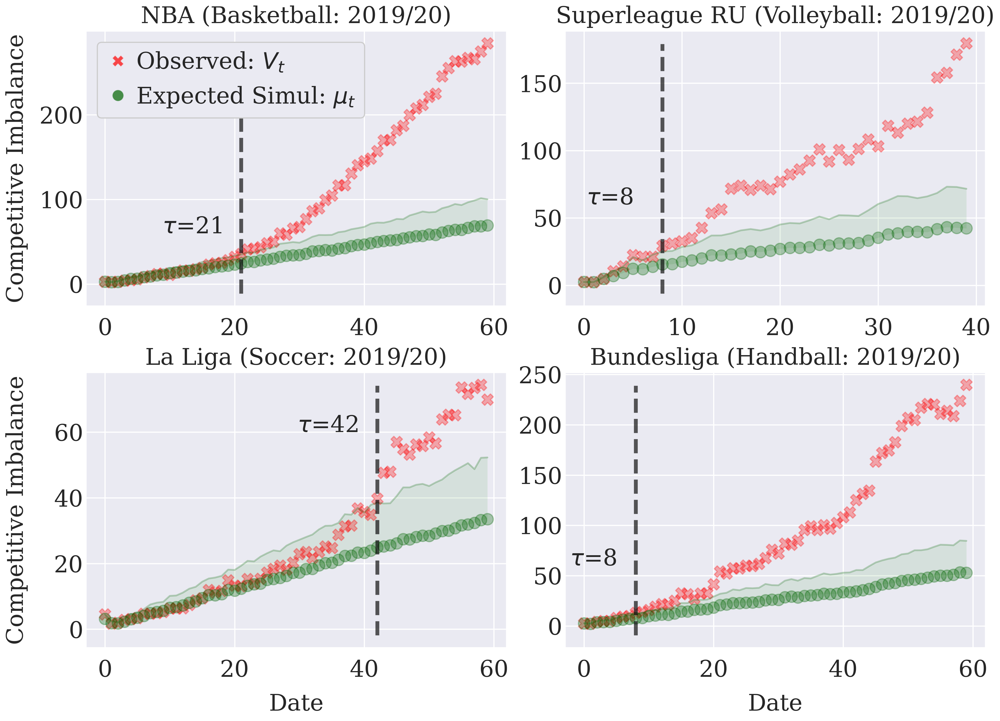

In [11]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13))

plot_variances_temporal_progression(
    fig, axs,
    key_to_sport_to_data["tp"],
    key_to_sport_to_data["var_stats"],
    TOURNEY_NAMES_AND_IDS,
    LAST_DATE,
)
for ax in flatten_axes(axs):
    ax.set_title(ax.get_title(), fontsize=30)

plt.savefig(path.PLOT_PATH / "variance_progression.pdf")

<h2> Turning Point </h2>

<h3> All tournaments </h3>

In [12]:
MTP_TP_COLUMNS = {
    "match turning point": "Matches",
    "%turning point": "%Date"
}

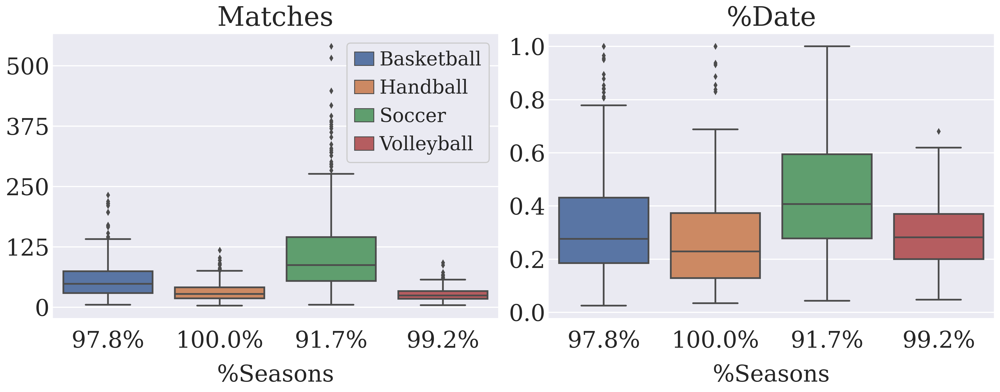

In [13]:
fig, axs = plt.subplots(ncols=2, figsize=(18, 7))

plot_boxplot_turning_points(
    axs,
    key_to_sport_to_data["tp"],
    key_to_sport_to_data["mtp"],
    MTP_TP_COLUMNS,
)

axs[0].set_yticks([0, 125, 250, 375, 500])

plt.savefig(path.PLOT_PATH / "turning_point_all_tournaments_boxplot.pdf")

<h3> Division </h3>

In [14]:
from data_analysis.division import Division

div_data = Division(pd.read_csv(path.DATA_PATH / "divisions.csv"))
div_data.df.value_counts(["sport", "division"]).sort_index()

sport       division
basketball  1           35
handball    1           30
soccer      1           62
            2           15
            3            3
volleyball  1           29
            2            1
dtype: int64

In [15]:
SPORT = "soccer"
tp_df = key_to_sport_to_data["tp"][SPORT].df

div_df = pd.concat(
    {div: tp_df.loc[div_data.filter_division_in_index(tp_df, div)] for div in [1, 2]},
    axis="columns"
)

In [16]:
infinite_percent_div1 = np.mean(div_df[(1, "%turning point")].dropna() < 2)
infinite_percent_div2 = np.mean(div_df[(2, "%turning point")].dropna() < 2)

HUE_COLUMNS = {
    (1, "%turning point"): f"First\n{infinite_percent_div1:.1%}",
    (2, "%turning point"): f"Second\n{infinite_percent_div2:.1%}",
}

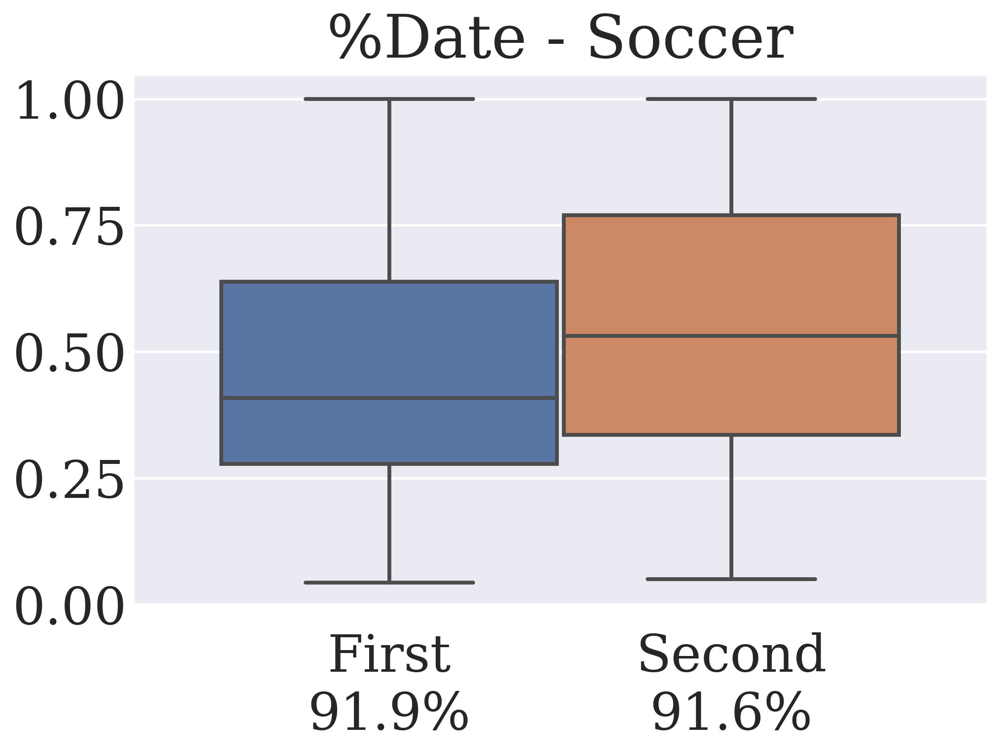

In [17]:
_, ax = plt.subplots(figsize=(8, 6))
plot_comparison_boxplot(ax, {"soccer": div_df}, hue_columns=HUE_COLUMNS, legend=False)

ax.set_title("%Date - Soccer")
ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
ax.set_xticks([-0.20, 0.20], HUE_COLUMNS.values())

plt.savefig(path.PLOT_PATH / "division_comparison_boxplot.pdf")

<h3> Other Point System </h3>

In [18]:
other_point_system = {
    "volleyball": pd.concat(
            {
            "normal": key_to_sport_to_data["tp"]["volleyball"].df,
            "new": key_to_sport_to_data["diff_points_tp"]["volleyball"].df,
        }, axis="columns"
    )
}

In [19]:
TP_COLUMNS = {
    ("normal", "%turning point"): "3:2 - (3, 0)",
    ("new", "%turning point"): "3:2 - (2, 1)",
}

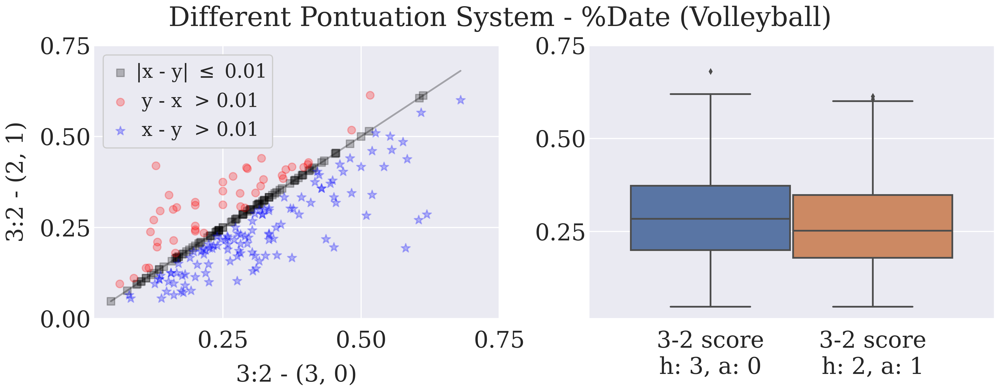

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(18, 7))

plot_new_pontuation_system(fig, axs, other_point_system, tp_columns=TP_COLUMNS)
axs[0].legend(fontsize=25)
fig.suptitle("Different Pontuation System - %Date (Volleyball)", size=35)

plt.savefig(path.PLOT_PATH / "new_pontuation_system.pdf")

<h3> Other Quantile </h3>

In [21]:
other_quantile = {
    sport: pd.concat(
            { 
                "normal": key_to_sport_to_data["tp"][sport].df, 
                "new": key_to_sport_to_data["tp/0.99"][sport].df,
            }
        , axis="columns"
    )
    for sport in SPORTS
}

In [22]:
TP_COLUMNS = {
    ("normal", "%turning point"): r"0.95 quantile: $\tau_\%$",
    ("new", "%turning point"): r"0.99 quantile: $\tau_\%$",
}

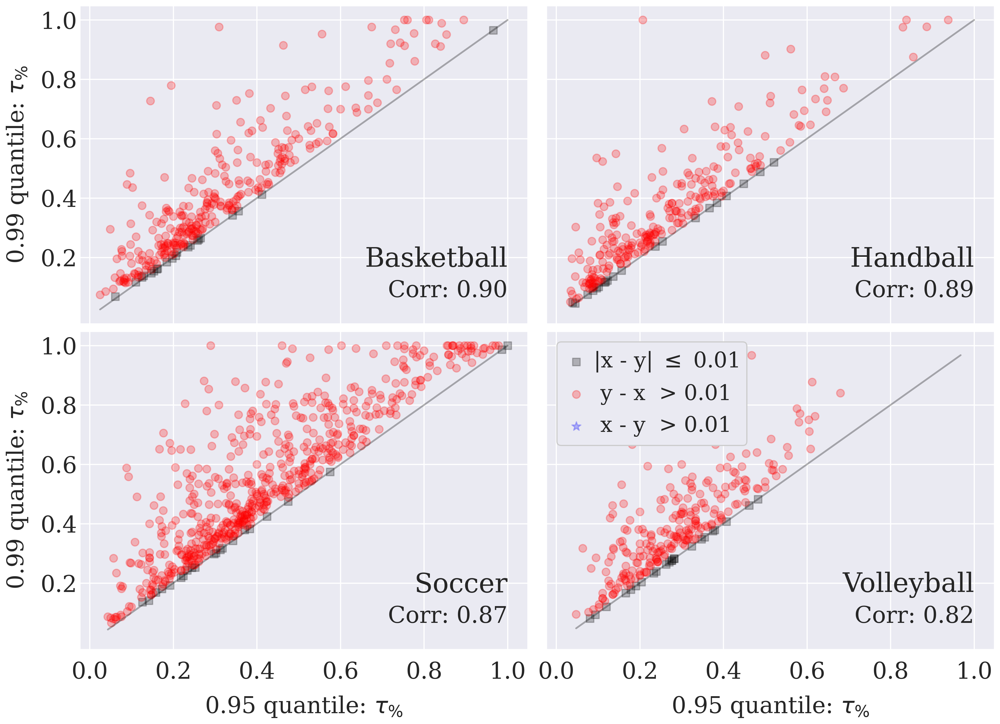

In [23]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    other_quantile,
    TP_COLUMNS,
    x_equals_y_line=True,
    linregress=False,
)

flat_axs[0].set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
flat_axs[3].legend(loc="upper left", fontsize=28)

plt.savefig(path.PLOT_PATH / "turning_point_diff_point_system_comparison_scatter.pdf")

<h2> Permuted Turning Point </h2>

<h3> All tournaments </h3>

In [24]:
HUE_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    ("%turning point", "mean"): r"Expected: $\hat\tau_\%$",
}

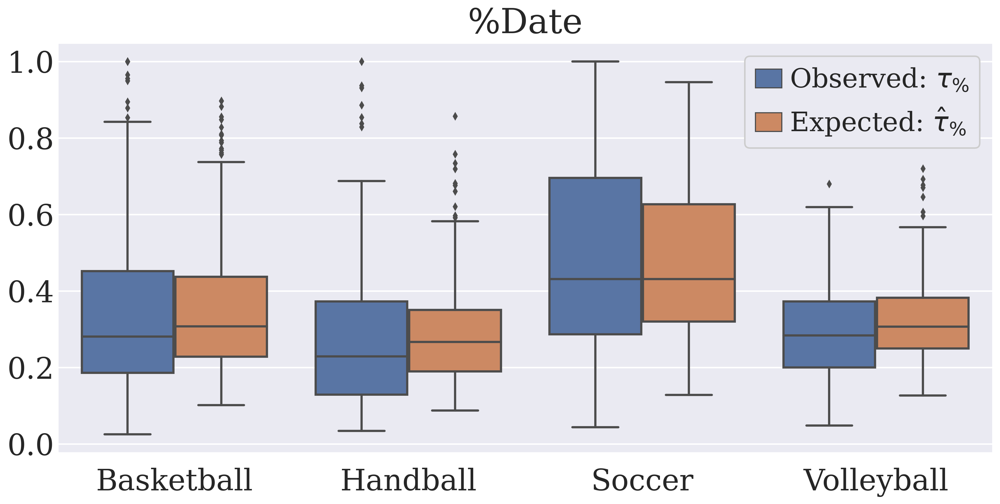

In [25]:
_, ax = plt.subplots(figsize=(14, 7))
plot_comparison_boxplot(
    ax,
    key_to_sport_to_data["comparison_tp"],
    x_column="sport",
    hue_columns=HUE_COLUMNS
)

ax.set_title("%Date")
ax.legend(fontsize=27)

plt.savefig(path.PLOT_PATH / "normal_permuted_comparison_boxplot.pdf")

<h3> Scatter Comparison </h3>

In [26]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    ("%turning point", "mean"): r"Expected: $\hat\tau_\%$",
}

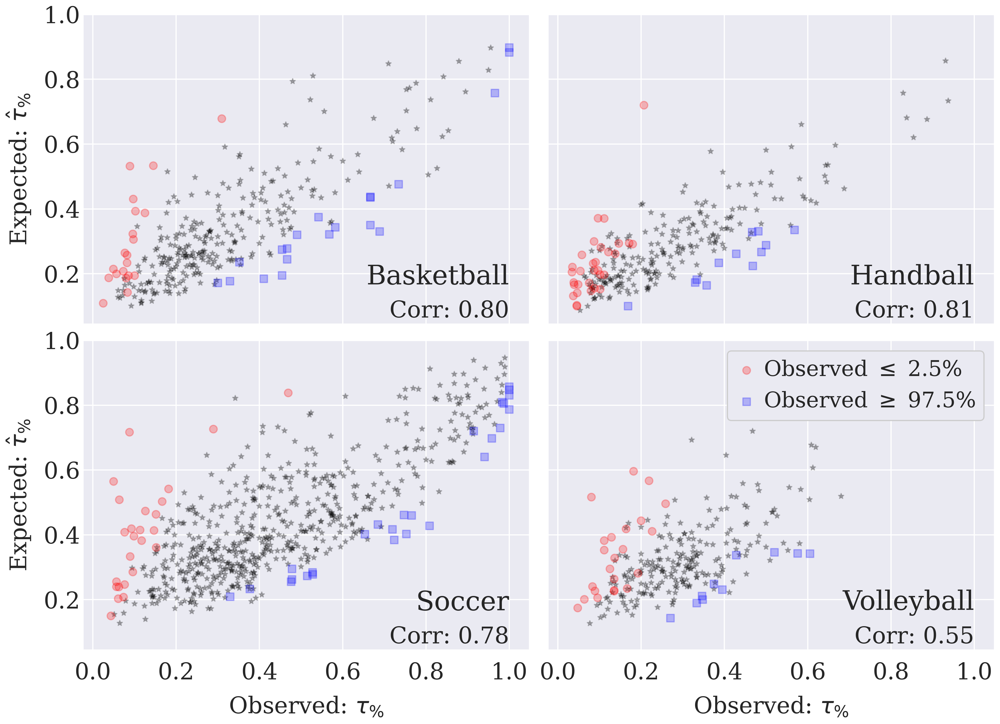

In [27]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_confidence_interval(
    fig, axs,
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    x_equals_y_line=False,
)

flat_axs[0].set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
flat_axs[3].legend(loc="upper right", fontsize=28)

plt.savefig(path.PLOT_PATH / "turning_point_permuted_comparison_scatter.pdf")

<h3> Bookmakers Predictions </h3>

In [28]:
from data_analysis.numeric_analysis import get_sport_to_bookmakers_comparison

TP_COLUMN = ("%turning point", "mean")
PLOT_COLUMNS = {
    TP_COLUMN: r"Expected: $\hat\tau_\%$", 
    "%bookmarker": "Betting Houses' Accuracy"
}

sport_to_bookmakers = get_sport_to_bookmakers_comparison(
    key_to_sport_to_data["matches"],
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMN,
    min_present=0.85,
)

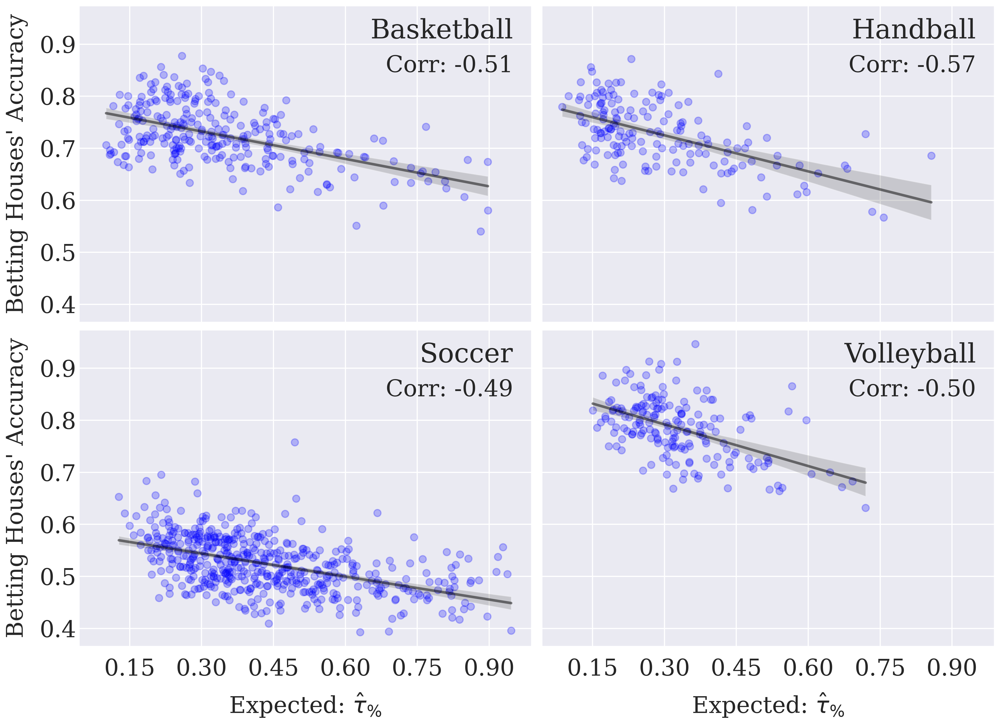

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")

comp_scatter.plot_scatter_according_to_binned_intervals(
    fig, axs,
    sport_to_bookmakers,
    PLOT_COLUMNS,
    linregress=True,
    x_equals_y_line=False,
    title_as_text_kwargs={"y": 0.95, "x": 0.95, "va": "top"},
    pearson_corr_kwargs={"y": 0.88, "x": 0.95, "va": "top"},
)

first_ax = axs[0][0]
first_ax.set_yticks([0.40, 0.50, 0.60, 0.70, 0.80, 0.90])
first_ax.set_xticks([0.15, 0.30, 0.45, 0.60, 0.75, 0.90])

plt.savefig(path.PLOT_PATH / "bookmakers_predictions_comparison.pdf")

<h2> Optimal Turning Point </h2>

<h3> Oracle </h3>

In [30]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    # ("%turning point", "mean"): r"Expected: $\hat\tau_\%$",
    ("%turning point", "tp_maximizer-current"): r"Oracle Max: $\tau_\%^{\mathrm{max}}$",
}

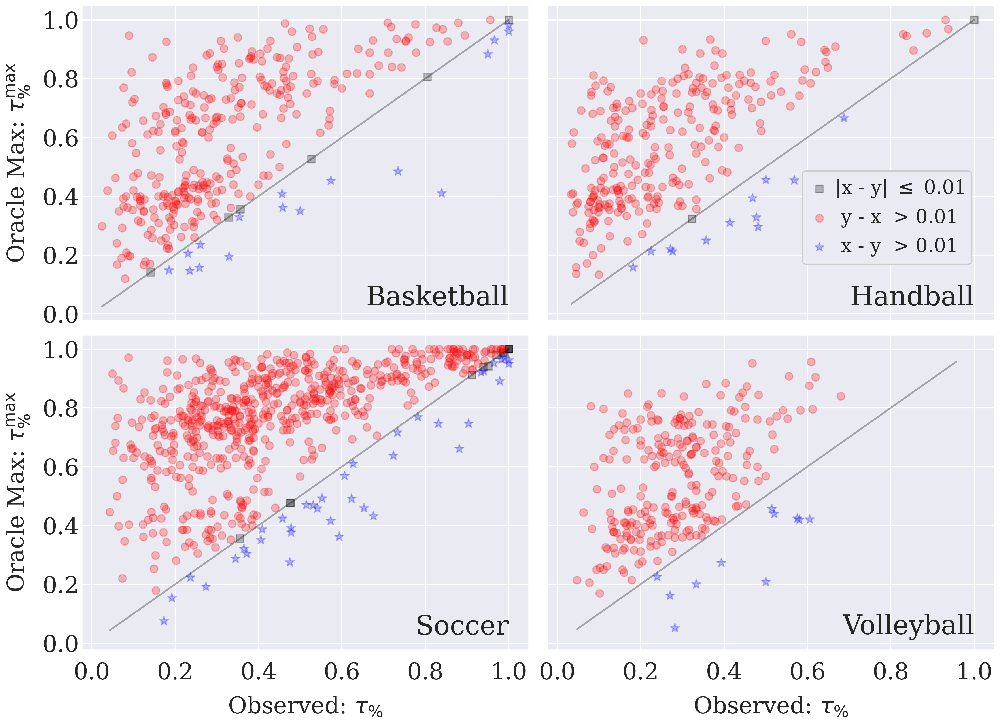

In [31]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    title_as_text_kwargs={"y": 0.01},
)

flat_axs[1].legend(loc=(0.57, 0.18), fontsize=25)

plt.savefig(path.PLOT_PATH / "turning_point_oracle_maximizer_comparison_scatter.pdf")

<h3> Yesterday Model </h3>

In [32]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    # ("%turning point", "mean"): r"Expected: $\hat\tau_\%$",
    ("%turning point", "tp_maximizer-previous"): r"Yesterday Max: $\tau_\%^{\mathrm{max}}$",
}

div1_comparison = {
    sport: comparison.loc[div_data.filter_division_in_index(comparison, division=1)]
    for sport, comparison in key_to_sport_to_data["comparison_tp"].items()
}

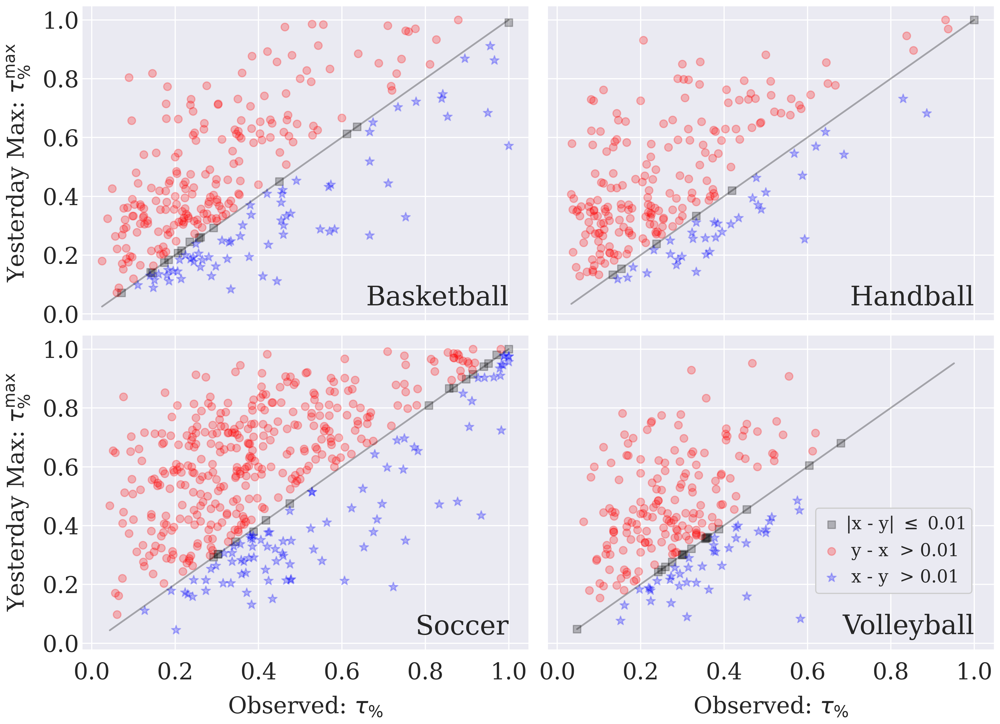

In [33]:
fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    div1_comparison,
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    title_as_text_kwargs={"y": 0.01},
)

flat_axs[-1].legend(loc=(0.6, 0.18), fontsize=23)

plt.savefig(path.PLOT_PATH / "turning_point_yesterday_maximizer_comparison_scatter.pdf")

<h3> Half-Maximizer </h3>

In [34]:
from data_analysis.double_round_robin import FilterDRR

filter_instance = FilterDRR.from_sport_to_matches(key_to_sport_to_data["matches"])
double_round_robins = filter_instance.filter_double_round_robins(key_to_sport_to_data["comparison_tp"])

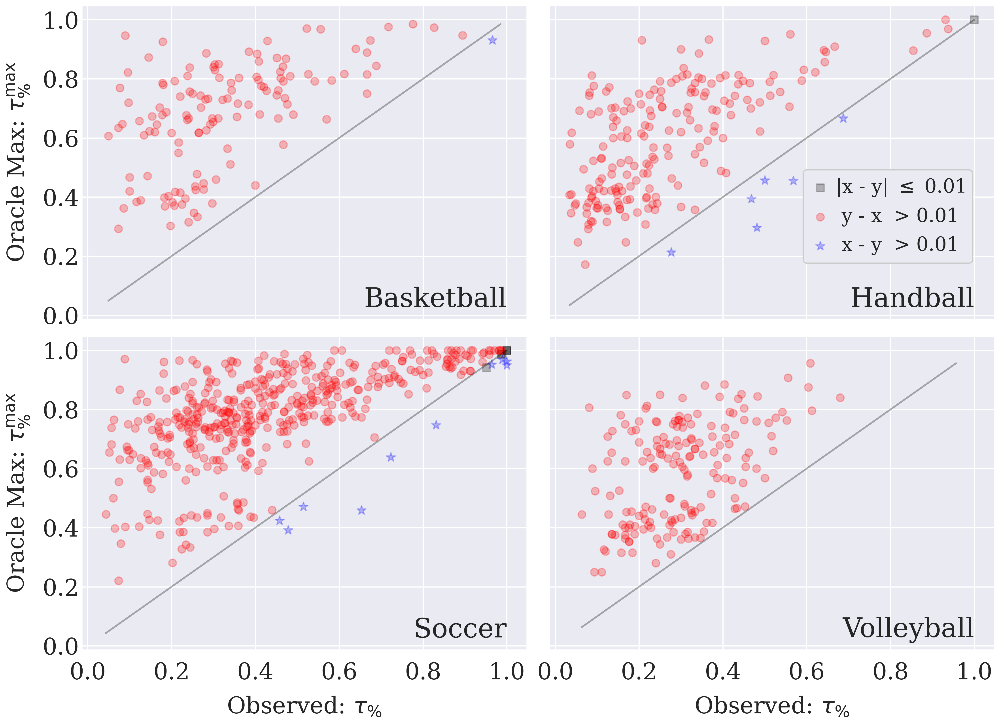

In [35]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    # ("%turning point", "mean"): r"Expected: $\hat\tau_\%",
    ("%turning point", "tp_maximizer-current"): r"Oracle Max: $\tau_\%^{\mathrm{max}}$",
    # ("%turning point", "tp_maximizer-previous"): r"Yesterday Max: $\tau_\%^{\mathrm{max}}$",
    # ("%turning point", "tp_maximizer_reversed-current"): r"Oracle MaxMin: $\tau_\%^{\mathrm{maxmin}}$",
}

fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    double_round_robins, #key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    title_as_text_kwargs={"y": 0.01},
)

flat_axs[1].legend(loc=(0.57, 0.18), fontsize=25)
plt.savefig(path.PLOT_PATH / "turning_point_oracle_maximizer_comparison_scatter_first_division.pdf")

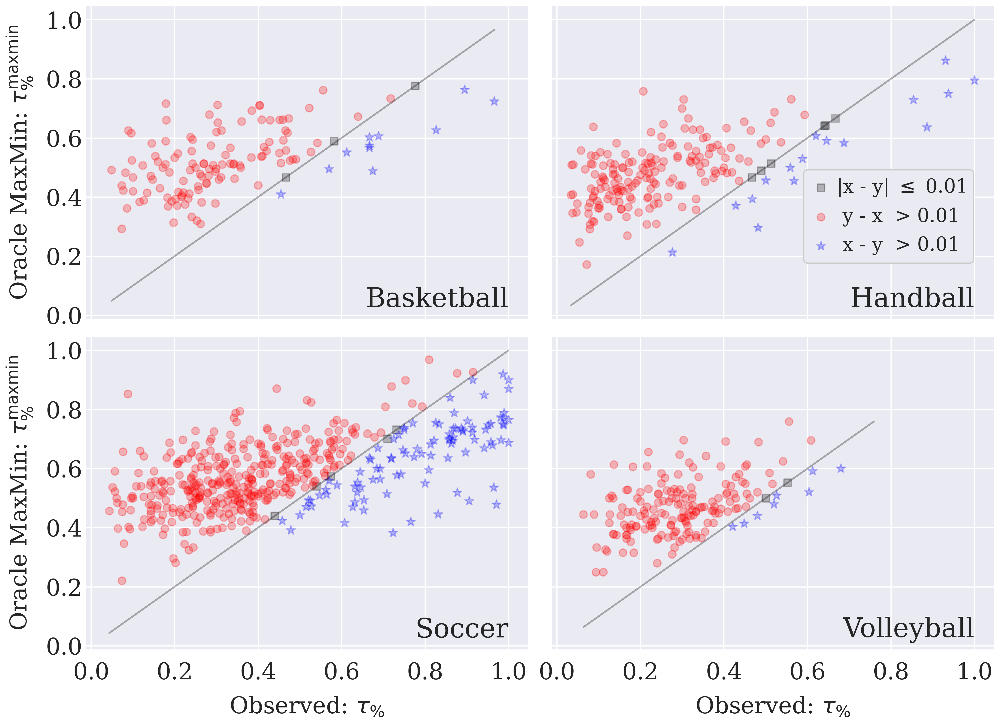

In [36]:
TP_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    # ("%turning point", "mean"): r"Expected: $\hat\tau_\%",
    # ("%turning point", "tp_maximizer-current"): r"Oracle Max: $\tau_\%^{\mathrm{max}}$",
    # ("%turning point", "tp_maximizer-previous"): r"Yesterday Max: $\tau_\%^{\mathrm{max}}$",
    ("%turning point", "tp_maximizer_reversed-current"): r"Oracle MaxMin: $\tau_\%^{\mathrm{maxmin}}$",
}

fig, axs = plt.subplots(2, 2, figsize=(18, 13), sharex="all", sharey="all")
flat_axs = flatten_axes(axs)

comp_scatter.plot_scatter_according_to_line_x_equals_y(
    fig, axs,
    double_round_robins, #key_to_sport_to_data["comparison_tp"],
    TP_COLUMNS,
    pearson_corr_kwargs=None,
    title_as_text_kwargs={"y": 0.01},
)

flat_axs[1].legend(loc=(0.57, 0.18), fontsize=25)
plt.savefig(path.PLOT_PATH / "turning_point_oracle_maxmin_comparison_scatter_first_division.pdf")

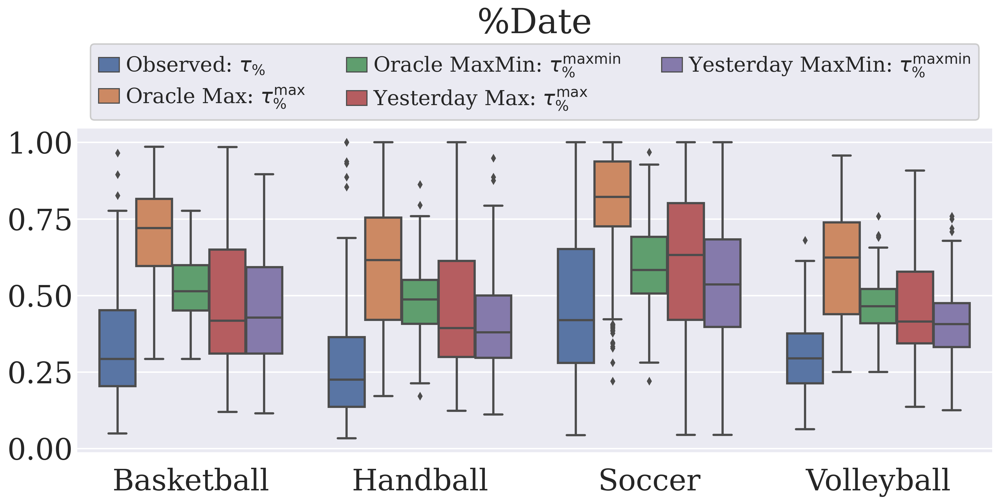

In [37]:
HUE_COLUMNS = {
    ("%turning point", "normal"): r"Observed: $\tau_\%$",
    ("%turning point", "tp_maximizer-current"): r"Oracle Max: $\tau_\%^{\mathrm{max}}$",
    ("%turning point", "tp_maximizer_reversed-current"): r"Oracle MaxMin: $\tau_\%^{\mathrm{maxmin}}$",
    ("%turning point", "tp_maximizer-previous"): r"Yesterday Max: $\tau_\%^{\mathrm{max}}$",
    ("%turning point", "tp_maximizer_reversed-previous"): r"Yesterday MaxMin: $\tau_\%^{\mathrm{maxmin}}$",
}

LEGEND_PARAMETERS = {
    "ncol": 3,
    "loc": "center",
    "fontsize": 21,
}
_, ax = plt.subplots(figsize=(14, 7))

plot_comparison_boxplot(
    ax,
    double_round_robins, #key_to_sport_to_data["comparison_tp"],
    x_column="sport",
    hue_columns=HUE_COLUMNS
)
ax.set_title("%Date", pad=96)
ax.legend(bbox_to_anchor = (0.5, 1.14), **LEGEND_PARAMETERS)
plt.savefig(path.PLOT_PATH / "turning_point_boxplot_maxmin_first_division.pdf")

<h2> Numerical Analysis </h2>

<h3> Statistical data </h3>

All tournaments

In [38]:
from data_analysis.numeric_analysis import get_statistical_information

COLUMNS = ["turning point", "%turning point", "match turning point", "%match turning point"]
get_statistical_information(
    {
        sport: pd.concat(
            [key_to_sport_to_data["tp"][sport].df, key_to_sport_to_data["mtp"][sport].df],
            axis="columns"
        )
        for sport in SPORTS
    }, COLUMNS
)

basketball    handball      soccer  volleyball
tp_type              tp_data                                                
turning point        count    315.000000  263.000000  640.000000  254.000000
                     mean      22.419048   13.752852   35.793750   10.555118
                     std       16.980195   10.195968   22.701188    6.039635
                     min        2.000000    1.000000    2.000000    1.000000
                     25%       10.500000    7.000000   19.000000    6.000000
                     50%       18.000000   11.000000   30.000000    9.500000
                     75%       29.500000   18.000000   47.000000   13.000000
                     max      107.000000   70.000000  123.000000   29.000000
%turning point       count    315.000000  263.000000  640.000000  254.000000
                     mean       0.329777    0.274788    0.457044    0.292359
                     std        0.206789    0.189295    0.239375    0.126226
                     min        0.024845    0.033898    0.043478    0.047619
                     25%        0.184826    0.128571    0.277676    0.200000
                     50%        0.275862    0.228916    0.406785    0.282051
                     75%        0.430502    0.372715    0.594301    0.369481
                     max        1.000000    1.000000    1.000000    0.680000
match turning point  count    315.000000  263.000000  640.000000  254.000000
                     mean      58.231746   32.365019  108.690625   26.755906
                     std       40.986485   20.479273   78.403941   14.388575
                     min        5.000000    3.000000    5.000000    4.000000
                     25%       29.000000   18.000000   54.000000   17.000000
                     50%       48.000000   27.000000   87.000000   24.000000
                     75%       74.000000   41.000000  145.000000   33.000000
                     max      232.000000  118.000000  540.000000   92.000000
%match turning point count    315.000000  263.000000  640.000000  254.000000
                     mean       0.307203    0.253811    0.434525    0.259985
                     std        0.201612    0.176337    0.232969    0.122545
                     min        0.016260    0.016484    0.027778    0.028571
                     25%        0.171123    0.116952    0.258101    0.168182
                     50%        0.250000    0.219697    0.385118    0.251374
                     75%        0.402433    0.334077    0.572321    0.332677
                     max        0.991071    0.988889    0.988889    0.655556

New Pontuation System

In [39]:
to_multiply = [["normal", "new"], ["turning point", "%turning point"]]
NEW_POINTS_COLUMNS = pd.MultiIndex.from_product(to_multiply)

In [40]:
get_statistical_information(other_point_system, NEW_POINTS_COLUMNS).unstack(["tp_type", "tp_data"])

volleyball                                            
tp_type        normal                          new               
tp_data turning point %turning point turning point %turning point
count      254.000000     254.000000    255.000000     255.000000
mean        10.555118       0.292359      9.674510       0.268528
std          6.039635       0.126226      5.703979       0.120513
min          1.000000       0.047619      1.000000       0.047619
25%          6.000000       0.200000      5.000000       0.179029
50%          9.500000       0.282051      9.000000       0.250000
75%         13.000000       0.369481     12.000000       0.346197
max         29.000000       0.680000     29.000000       0.612903

Optimal Turning Point

In [41]:
from data_analysis.numeric_analysis import get_optimal_comparison

TP_TYPE = "%turning point"
OPTIMAL_COLUMNS = [
    "normal",
    "tp_minimizer-current",
    "tp_minimizer-previous",
    "tp_maximizer-current",
    "tp_maximizer-previous"
]

all_sports_df = pd.concat(key_to_sport_to_data["comparison_tp"]).reset_index(0, drop=True)
sport_to_comparison = key_to_sport_to_data["comparison_tp"] | {"total": all_sports_df}

all_sports_drr_df = pd.concat(double_round_robins).reset_index(0, drop=True)
sport_to_drr_comparison = double_round_robins | {"total": all_sports_df} 

# all_sport_df_div1 = all_sports_df.loc[div_data.filter_division_in_index(all_sports_df, division=1)]
# sport_to_comparison_div1 = div1_comparison | {"total": all_sport_df_div1}

optimal_comp = {
    "all": get_optimal_comparison(
        sport_to_comparison, OPTIMAL_COLUMNS, TP_TYPE
    ),
    "drr": get_optimal_comparison(
        sport_to_drr_comparison, OPTIMAL_COLUMNS, TP_TYPE
    )
}
pd.concat(optimal_comp, axis="columns")

all                                \
                                    < 2.5%    < real    < mean    > mean   
optimal col           sport                                                
normal                basketball  0.031056  0.000000  0.546584  0.431677   
                      handball    0.068441  0.000000  0.604563  0.395437   
                      soccer      0.030086  0.000000  0.435530  0.479943   
                      volleyball  0.046875  0.000000  0.625000  0.367188   
                      total       0.039636  0.000000  0.519168  0.436647   
tp_minimizer-current  basketball  0.527950  0.816770  0.900621  0.077640   
                      handball    0.589354  0.889734  0.969582  0.026616   
                      soccer      0.587393  0.825215  0.858166  0.057307   
                      volleyball  0.527344  0.871094  0.949219  0.042969   
                      total       0.565302  0.842105  0.901235  0.053931   
tp_minimizer-previous basketball  0.239130  0.602484  0.723602  0.145963   
                      handball    0.346008  0.707224  0.817490  0.068441   
                      soccer      0.209169  0.591691  0.606017  0.210602   
                      volleyball  0.257812  0.636719  0.761719  0.113281   
                      total       0.246914  0.621183  0.692658  0.156595   
tp_maximizer-current  basketball  0.000000  0.052795  0.059006  0.919255   
                      handball    0.000000  0.045627  0.041825  0.954373   
                      soccer      0.000000  0.060172  0.040115  0.878223   
                      volleyball  0.003906  0.042969  0.042969  0.949219   
                      total       0.000650  0.053281  0.044834  0.911631   
tp_maximizer-previous basketball  0.012422  0.214286  0.211180  0.658385   
                      handball    0.000000  0.136882  0.136882  0.745247   
                      soccer      0.008596  0.204871  0.181948  0.637536   
                      volleyball  0.007812  0.160156  0.152344  0.722656   
                      total       0.007797  0.187784  0.175439  0.674464   

                                                           drr            \
                                    > real   > 97.5%    < 2.5%    < real   
optimal col           sport                                                
normal                basketball  0.000000  0.046584  0.045802  0.000000   
                      handball    0.000000  0.034221  0.077720  0.000000   
                      soccer      0.000000  0.027221  0.034137  0.000000   
                      volleyball  0.000000  0.023438  0.051136  0.000000   
                      total       0.000000  0.031839  0.039636  0.000000   
tp_minimizer-current  basketball  0.130435  0.000000  0.694656  0.923664   
                      handball    0.053232  0.000000  0.647668  0.917098   
                      soccer      0.084527  0.001433  0.680723  0.891566   
                      volleyball  0.085938  0.000000  0.602273  0.926136   
                      total       0.089019  0.000650  0.565302  0.842105   
tp_minimizer-previous basketball  0.223602  0.012422  0.305344  0.709924   
                      handball    0.110266  0.015209  0.383420  0.704663   
                      soccer      0.210602  0.004298  0.251004  0.638554   
                      volleyball  0.187500  0.000000  0.272727  0.647727   
                      total       0.192333  0.007147  0.246914  0.621183   
tp_maximizer-current  basketball  0.906832  0.596273  0.000000  0.007634   
                      handball    0.946768  0.783270  0.000000  0.031088   
                      soccer      0.845272  0.631805  0.000000  0.024096   
                      volleyball  0.949219  0.621094  0.000000  0.000000   
                      total       0.892788  0.648473  0.000650  0.053281   
tp_maximizer-previous basketball  0.618012  0.242236  0.000000  0.160305   
                      handball    0.726236  0.357414  0.000000  0.119171   
          

<h3> No Turning Points </h3>

In [42]:
from data_analysis.numeric_analysis import get_no_tp

DESIRED_COLUMNS = [("%turning point", "normal")] 

no_tp = get_no_tp(sport_to_comparison, DESIRED_COLUMNS)
no_tp.groupby("sport").size()

sport
basketball     7
soccer        58
total         67
volleyball     2
dtype: int64

In [43]:
total_seasons = sum(
    key_to_sport_to_data["tp"][sport].df.index.unique().size
    for sport in SPORTS
)

no_tp.index.get_level_values("id").unique().size / total_seasons

0.043534762833008445

<h3> Low Turning Points </h3>

In [44]:
sum(
    (df[("%turning point", "mean")] < 0.10).sum()
    for _, df in key_to_sport_to_data["comparison_tp"].items()
)

1

In [45]:
sum(
    (df[("%turning point", "normal")] < 0.10).sum()
    for _, df in key_to_sport_to_data["comparison_tp"].items()
)

94

<h3> Inside envelopes </h3>

In [46]:
always_inside_envelope_count = []
seasons_count = []

for sport, var_stats in key_to_sport_to_data["var_stats"].items():
    inside_envelope = (var_stats.df["real var"] <= var_stats.df["0.950-quantile"])
    always_inside_envelope_count.append(inside_envelope.groupby("id", observed=True).all().sum() )
    seasons_count.append(var_stats.df.index.get_level_values("id").unique().size)

for sport, num_inside, total in zip(SPORTS, always_inside_envelope_count, seasons_count):
    print(sport, num_inside / total)

print(f"total {sum(always_inside_envelope_count)/sum(seasons_count)}")

basketball 0.009316770186335404
handball 0.0
soccer 0.027220630372492838
volleyball 0.0
total 0.014294996751137101


<h3> Divisions </h3>

In [47]:
with pd.option_context("mode.use_inf_as_na", True):
    print(div_df[1].dropna().shape[0], div_df[2].dropna().shape[0])
    print(div_df[1].dropna().mean())

501 120
turning point     34.540918
%turning point     0.437635
dtype: float64


<h3> Bookmakers Predictions </h3>

In [48]:
def get_unique_seasons(df: pd.DataFrame) -> list[str]:
    return df.index.get_level_values("id").unique().to_list()

seasons_count = []
all_odds_count = []

for sport in SPORTS:
    all_odds_count.append(len(get_unique_seasons(sport_to_bookmakers[sport])))
    seasons_count.append(len(get_unique_seasons(key_to_sport_to_data["matches"][sport].df)))
    
for sport, all_odds, seasons in zip(SPORTS, all_odds_count, seasons_count):
    print(sport, all_odds/seasons)

print(f"total {sum(all_odds_count)/sum(seasons_count)}")

basketball 0.860248447204969
handball 0.6273764258555133
soccer 0.8051575931232091
volleyball 0.71875
total 0.7719298245614035


<h3> Mean per tournament </h3>

In [49]:
from data_analysis.numeric_analysis import get_mean_per_tournament
sport_order = ["soccer", "basketball", "volleyball", "handball"]

COLUMNS = [
    ("%turning point", "normal"),
    ("%turning point", "mean"),
    ("%turning point", "tp_maximizer-current"),
    ("%turning point", "tp_maximizer-previous"),
]

mean_per_tournament = get_mean_per_tournament(
    key_to_sport_to_data["comparison_tp"],
    COLUMNS,
)

mean_per_tournament.groupby("sport", as_index=False).nth(list(range(3))).loc[sport_order]

%turning point            \
                                                 normal      mean   
sport      name                 country                             
soccer     serie-a              italy          0.239803  0.232898   
           premier-league       england        0.235086  0.237313   
           laliga               spain          0.347745  0.247830   
basketball nba                  usa            0.118441  0.130889   
           b-league             japan          0.116743  0.170449   
           bbl                  germany        0.235831  0.211625   
volleyball superleague          ukraine        0.171699  0.209295   
           division-a           belarus        0.236978  0.225823   
           extraliga            hungary        0.245484  0.238119   
handball   andebol-1            portugal       0.142009  0.155649   
           bundesliga           germany        0.137744  0.160792   
           liga-nationala-women romania        0.122185  0.192562   

                                                               \
                                         tp_maximizer-current   
sport      name                 country                         
soccer     serie-a              italy                0.614775   
           premier-league       england              0.641545   
           laliga               spain                0.712747   
basketball nba                  usa                  0.351917   
           b-league             japan                0.202598   
           bbl                  germany              0.561703   
volleyball superleague          ukraine              0.311779   
           division-a           belarus              0.389944   
           extraliga            hungary              0.425666   
handball   andebol-1            portugal             0.378726   
           bundesliga           germany              0.484265   
           liga-nationala-women romania              0.490468   

                                                                
                                         tp_maximizer-previous  
sport      name                 country                         
soccer     serie-a              italy                 0.448540  
           premier-league       england               0.441882  
           laliga               spain                 0.587195  
basketball nba                  usa                   0.181477  
           b-league             japan                 0.105929  
           bbl                  germany               0.344546  
volleyball superleague          ukraine               0.293172  
           division-a           belarus               0.371061  
           extraliga            hungary               0.300682  
handball   andebol-1            portugal              0.333309  
           bundesliga           germany               0.374021  
           liga-nationala-women romania               0.358337

In [50]:
soccer = mean_per_tournament.loc["soccer"].reset_index()
soccer[soccer["country"].isin({"brazil", "france", "germany"})]

name  country %turning point                                 \
                                  normal      mean tp_maximizer-current   
12    bundesliga  germany       0.311907  0.329170             0.744963   
15       ligue-1   france       0.371053  0.348205             0.745124   
44       serie-a   brazil       0.507180  0.488277             0.880933   
52  2-bundesliga  germany       0.537065  0.521698             0.903353   
55       serie-b   brazil       0.628847  0.541795             0.909622   

                          
   tp_maximizer-previous  
12              0.521917  
15              0.505557  
44              0.660212  
52              0.653013  
55              0.601498

<h3> Envelope fluctuations </h3>

In [51]:
from data_analysis.numeric_analysis import get_variance_fluctuating_close_to_envelope

In [52]:
KWARGS = {
    "var_col": "real var",
    "envelope_col": "0.950-quantile",
    "max_sequence_size": 10,
}

fluctuation_size = get_variance_fluctuating_close_to_envelope(key_to_sport_to_data["var_stats"], **KWARGS)
fluctuation_size

above_below_above                                below_above_below  \
         basketball  handball    soccer volleyball        basketball   
1          0.642857  0.498099  0.746418   0.421875          0.642857   
2          0.447205  0.292776  0.570201   0.242188          0.459627   
3          0.360248  0.201521  0.477077   0.152344          0.329193   
4          0.291925  0.163498  0.419771   0.101562          0.232919   
5          0.239130  0.110266  0.381089   0.066406          0.183230   
6          0.204969  0.091255  0.346705   0.058594          0.164596   
7          0.158385  0.072243  0.303725   0.042969          0.133540   
8          0.133540  0.057034  0.273639   0.039062          0.108696   
9          0.124224  0.049430  0.250716   0.035156          0.096273   

                                  
   handball    soccer volleyball  
1  0.498099  0.746418   0.421875  
2  0.334601  0.551576   0.242188  
3  0.228137  0.432665   0.144531  
4  0.144487  0.349570   0.101562  
5  0.091255  0.277937   0.070312  
6  0.072243  0.222063   0.039062  
7  0.045627  0.179083   0.027344  
8  0.038023  0.150430   0.023438  
9  0.030418  0.128940   0.019531